In [1]:
## For data handling
import pandas as pd
import numpy as np

## For plotting
import matplotlib.pyplot as plt
from seaborn import set_style
import seaborn as sns
## This sets the plot style
## to have a grid on a white background
set_style("white")

#For machine learning methods
from sklearn.model_selection import train_test_split

#For neural network
from tensorflow import keras 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img

## Importing the things
from keras import models
from keras import layers
from keras import optimizers
from keras import losses
from keras import metrics
from keras.utils import to_categorical
import json

import skimage
print(skimage.__version__)

import warnings
warnings.filterwarnings('ignore')

## Checks what is tensorflow running on
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

## This imports datasets stored in keras
from keras.datasets import mnist

0.19.2
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 11521063475838790661
xla_global_id: -1
]


In [2]:
birds_db = pd.read_csv('./birds_archive/birds.csv')
birds_db.value_counts('labels')
birds_class = pd.read_csv('./birds_archive/class_dict.csv')
birds_names = pd.read_csv('./birds_archive/birds latin names.csv')

print(birds_names.head(2))
print('..................................\n')
print(birds_class.head(2))
print('..................................\n')
(birds_db.tail())
#birds_db.loc[birds_db.labels=='ABBOTTS BABBLER']
#birds_db.value_counts('labels')

   class_index            class       SCIENTIFIC NAME
0            0  ABBOTTS BABBLER  Malacocincla abbotti
1            1    ABBOTTS BOOBY      Papasula abbotti
..................................

   class_index            class  height  width  scale by  Offset
0            0  ABBOTTS BABBLER     112    112         1       0
1            1    ABBOTTS BOOBY     112    112         1       0
..................................



,class index,filepaths,labels,data set
62383,399,valid/YELLOW HEADED BLACKBIRD/1.jpg,YELLOW HEADED BLACKBIRD,valid
62384,399,valid/YELLOW HEADED BLACKBIRD/2.jpg,YELLOW HEADED BLACKBIRD,valid
62385,399,valid/YELLOW HEADED BLACKBIRD/3.jpg,YELLOW HEADED BLACKBIRD,valid
62386,399,valid/YELLOW HEADED BLACKBIRD/4.jpg,YELLOW HEADED BLACKBIRD,valid
62387,399,valid/YELLOW HEADED BLACKBIRD/5.jpg,YELLOW HEADED BLACKBIRD,valid


In [3]:
birds_names_subset = birds_names.sample(100, random_state=42)
birds_names_subset = birds_names_subset.rename(columns={'class':'labels'})
print(birds_names_subset)

birds_db_subset = birds_db[birds_db['labels'].isin(birds_names_subset['labels'])].dropna()
birds_db_subset = birds_db_subset.reset_index()
birds_db_subset

#pd.DataFrame(pd.Series(label_dict, index=label_dict.keys()))
label_dict = {i:birds_names_subset['labels'].values[i] for i in range(len(birds_names_subset))}
labelsDF = pd.DataFrame(label_dict.items(), columns=['label_index','label'])
labelsDF

     class_index               labels         SCIENTIFIC NAME
209          209      HARLEQUIN QUAIL    Coturnix delegorguei
280          280    NORTHERN SHOVELER        Spatula clypeata
33            33             AVADAVAT       Amandava amandava
210          210          HARPY EAGLE          Harpia harpyja
93            93        CAPE LONGCLAW       Macronyx capensis
..           ...                  ...                     ...
314          314    RED FACED WARBLER   Cardellina rubrifrons
373          373    TROPICAL KINGBIRD  Tyrannus melancholicus
380          380  VERMILION FLYCATHER   Pyrocephalus obscurus
239          239           JACK SNIPE    Lymnocryptes minimus
75            75           BLUE HERON          Ardea herodias

[100 rows x 3 columns]


,label_index,label
0,0,HARLEQUIN QUAIL
1,1,NORTHERN SHOVELER
2,2,AVADAVAT
3,3,HARPY EAGLE
4,4,CAPE LONGCLAW
...,...,...
95,95,RED FACED WARBLER
96,96,TROPICAL KINGBIRD
97,97,VERMILION FLYCATHER
98,98,JACK SNIPE


In [4]:
%%time 
# this piece loads image data into a list and a numpy array 
bird_labels = []
bird_label_num = []
birdImage_list_jpg = []
birdImage_list = []

for indx, filepath, label in zip(range(len(birds_db_subset)), birds_db_subset.filepaths, birds_db_subset.labels):
    try:
        bird_labels.append(label)
        bird_label_num.append(labelsDF.loc[labelsDF['label'] == label, 'label_index'].values[0])
        #print(filepath)
        img = tf.keras.utils.load_img(
                './birds_archive/Data/'+filepath,
                grayscale=False,
                color_mode='rgb',
                target_size=None,
                interpolation='nearest',
                keep_aspect_ratio=False)
        
        # list of bird images in jpg format 
        birdImage_list_jpg.append(img)  
        
        img_arr = np.array(img)
        # List containng all bird images each in array format 
        birdImage_list.append(img_arr)
    except (TypeError, IndexError) as e:
        pass
        #print(indx, label)

# Numpy array N x 224x224x3 containing all bird images 
birdImage_arr = np.array(birdImage_list) 

X_train, X_val, y_train, y_val = train_test_split(birdImage_arr, (pd.DataFrame(bird_label_num)[0]).values,
                                                                          test_size=0.15, shuffle=True, random_state=44)
X_train = X_train / 255
X_val = X_val / 255
print(X_train.shape)
print()
print(X_val.shape)

(13339, 224, 224, 3)

(2355, 224, 224, 3)
CPU times: total: 25 s
Wall time: 1min 10s


In [5]:
X_train.shape, to_categorical(y_train).shape, X_val.shape, to_categorical(y_val).shape, #n_species

((13339, 224, 224, 3), (13339, 100), (2355, 224, 224, 3), (2355, 100))

# Instantiate VGG16 class
- pretrained on ImageNet dataset and included in Keras

In [6]:
from keras.applications import VGG16
conv_base = VGG16(weights='imagenet',
include_top=False,
input_shape=(224, 224, 3))
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

#  extraction of features from convolutional base

In [107]:
X_train_features = conv_base.predict(X_train)
X_val_features = conv_base.predict(X_val)

74/74 [==============================] - 446s 6s/step


In [108]:
from numpy import save
save('val_features100.npy', X_val_features)
save('train_features100.npy', X_train_features)
#data = load('val_features100.npy')
#print(data)

In [7]:
from numpy import load 
X_train_features = load('train_features100.npy')
X_val_features = load('val_features100.npy')

In [8]:
print(X_train_features.shape)

X_train_features_ = X_train_features.reshape(-1,7*7*512)
X_val_features_ = X_val_features.reshape(-1,7*7*512)

print(X_train_features_.shape)

(13339, 7, 7, 512)
(13339, 25088)


In [9]:
from keras.regularizers import l2 
from keras import models
from keras import layers
from keras import optimizers


n_species = to_categorical(y_train).shape[1]

model_ff = models.Sequential()
## # Now we'll add the fully connected layer >>> feedforward
model_ff.add(layers.Dense(256, activation='relu', input_dim=7*7*512) )
model_ff.add(layers.Dropout(.5))
model_ff.add(layers.Dense(128, activation='relu'))#, kernel_regularizer=l2(0.01), bias_regularizer=l2(0.01)))
## Finally an output layer
model_ff.add(layers.Dense(n_species, activation='softmax'))

model_ff.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               6422784   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dense_2 (Dense)             (None, 100)               12900     
                                                                 
Total params: 6,468,580
Trainable params: 6,468,580
Non-trainable params: 0
_________________________________________________________________


In [10]:
#Optionally load model 

from keras.models import load_model

model_ff = load_model('convNetvgg16_100species.h5')
model_ff.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 256)               6422784   
                                                                 
 dropout_9 (Dropout)         (None, 256)               0         
                                                                 
 dense_28 (Dense)            (None, 128)               32896     
                                                                 
 dense_29 (Dense)            (None, 100)               12900     
                                                                 
Total params: 6,468,580
Trainable params: 6,468,580
Non-trainable params: 0
_________________________________________________________________


In [22]:
%%time
# Compile the model 
from keras import optimizers
model_ff.compile(optimizer=optimizers.RMSprop(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=15,  restore_best_weights=True)
## First make the validation set

# ## Fit the model, and store the training history
## using 100 epochs and a batch_size of 512
n_epoch= 50
history_ff = model_ff.fit(X_train_features_, to_categorical(y_train), epochs=n_epoch, batch_size=64,
                   validation_data=(X_val_features_, to_categorical(y_val)), callbacks=[callback], verbose=1)

history_ff_dict = history_ff.history
print(history_ff_dict.keys())

#model_ff.save("convNet_birds_ff_regTemp.h5")
#print("Saved model to disk")

Epoch 1/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0695 - accuracy: 0.9932 - val_loss: 0.6721 - val_accuracy: 0.8297
Epoch 2/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0662 - accuracy: 0.9930 - val_loss: 0.6695 - val_accuracy: 0.8293
Epoch 3/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0646 - accuracy: 0.9926 - val_loss: 0.6718 - val_accuracy: 0.8301
Epoch 4/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0641 - accuracy: 0.9938 - val_loss: 0.6654 - val_accuracy: 0.8306
Epoch 5/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0635 - accuracy: 0.9942 - val_loss: 0.6664 - val_accuracy: 0.8301
Epoch 6/50
209/209 [==============================] - 8s 37ms/step - loss: 0.0620 - accuracy: 0.9938 - val_loss: 0.6660 - val_accuracy: 0.8306
Epoch 7/50
209/209 [==============================] - 8s 38ms/step - loss: 0.0589 - accuracy: 0.9938 - val_loss: 0.6654 - val_accuracy: 0.8280

In [21]:
model_ff.save("convNetvgg16_100species.h5")
print("Saved model to disk")

Saved model to disk


In [177]:
# run ONLY once
val_ff_accuracy = []
train_ff_accuracy = []

In [23]:
for tr, val, loss in zip(history_ff_dict['accuracy'], history_ff_dict['val_accuracy'], history_ff_dict['val_loss']): 
    train_ff_accuracy.append(tr)
    val_ff_accuracy.append(val)
    
with open("train_accuracy", "w") as fp:
    json.dump(train_ff_accuracy, fp)

with open("validation_accuracy", "w") as fp:
    json.dump(val_ff_accuracy, fp)

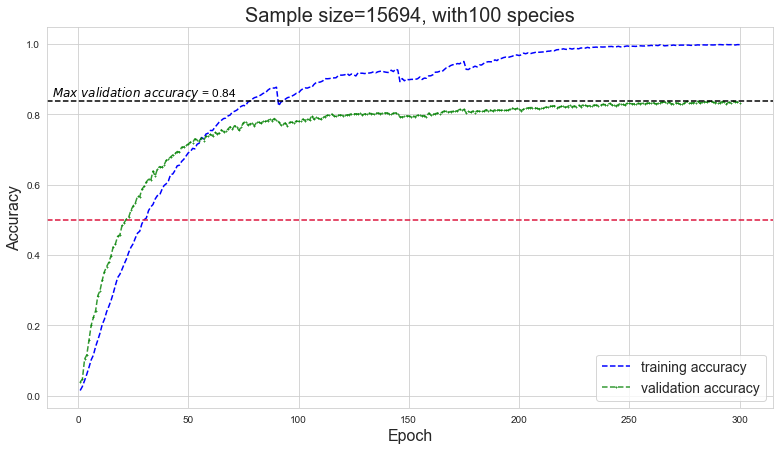

In [40]:
with open("train_accuracy", "r") as fp:
    train_ff_accuracy = json.load(fp)   
with open("validation_accuracy", "r") as fp:
    val_ff_accuracy = json.load(fp)
    
N = len(val_ff_accuracy) #n_epoch-1
# Display the metrics
set_style("whitegrid")
plt.figure(figsize=(13,7))
plt.plot(range(1,N+1), train_ff_accuracy,'b--', markersize=1,label='training accuracy')
plt.plot(range(1,N+1), val_ff_accuracy,'g--+', markersize=2, alpha=0.8, label='validation accuracy')
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Accuracy', fontsize=16)

plt.axhline(y=0.5, color='crimson', ls='--', alpha=1)
plt.axhline(y=np.array(val_ff_accuracy).max(), color='k', ls='--')

plt.text(-12,np.round(np.array(val_ff_accuracy).max(),2)+0.01, 
         '$Max ~validation ~ accuracy$ = ' +str(np.round(np.array(val_ff_accuracy).max(),2)), 
         color='k', fontsize=12 )


plt.legend(fontsize=14, loc='lower right')
plt.title('Sample size='+str(birdImage_arr.shape[0])+', with'+str(n_species)+' species', fontsize=20, loc='center', pad=None)
plt.savefig('perfomance_vgg16_100species.pdf')
plt.show()
plt.close()

100

 # Model perfomance

74/74 [==============================] - 1s 9ms/step


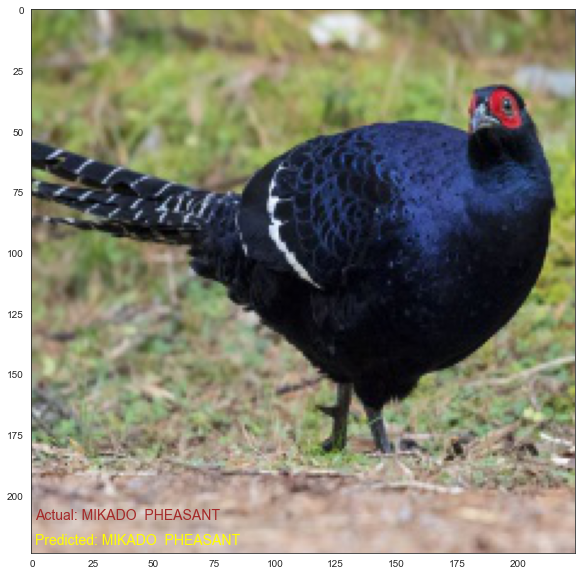

In [216]:


set_style("white")
# Prediction power
n=np.random.binomial(100,0.5,1)[0]
predicted_bird = model_ff.predict(X_val_features_)[n].argmax()
actual_bird = y_val[n]

plt.figure(figsize=(10,10))
plt.imshow(X_val[n], cmap='gray')
plt.text(1,220, 'Predicted: ' + str(labelsDF.loc[labelsDF['label_index'] == predicted_bird, 'label'].values[0]),
         color='yellow', fontsize=14 )

plt.text(1,210, 'Actual: ' + str(labelsDF.loc[labelsDF['label_index'] == actual_bird, 'label'].values[0]),
         color='brown', fontsize=14 )


plt.show()
plt.close()

74/74 [==============================] - 1s 9ms/step


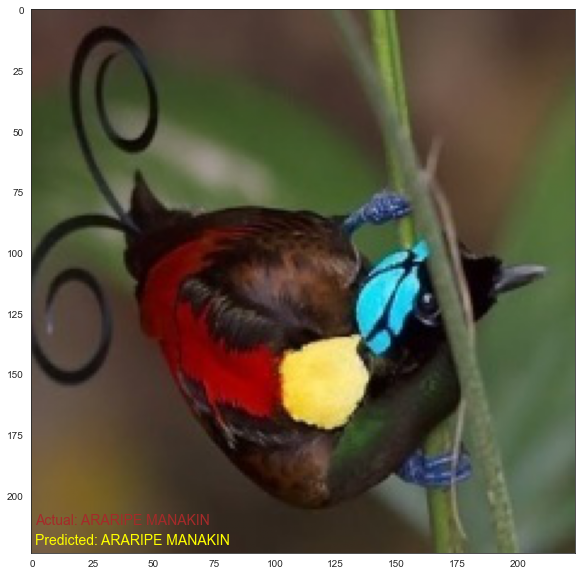

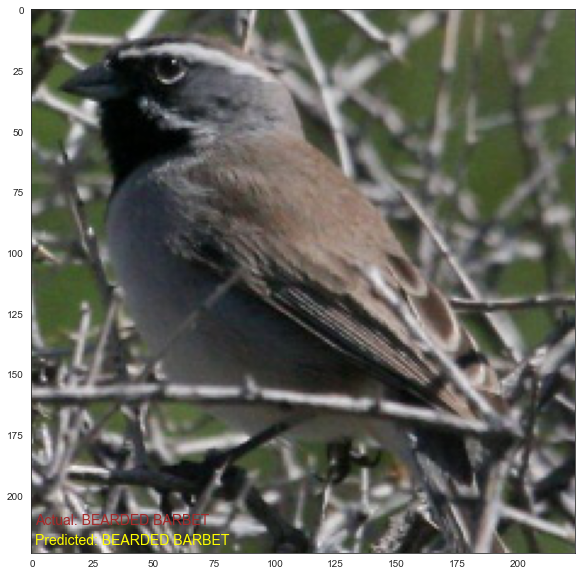

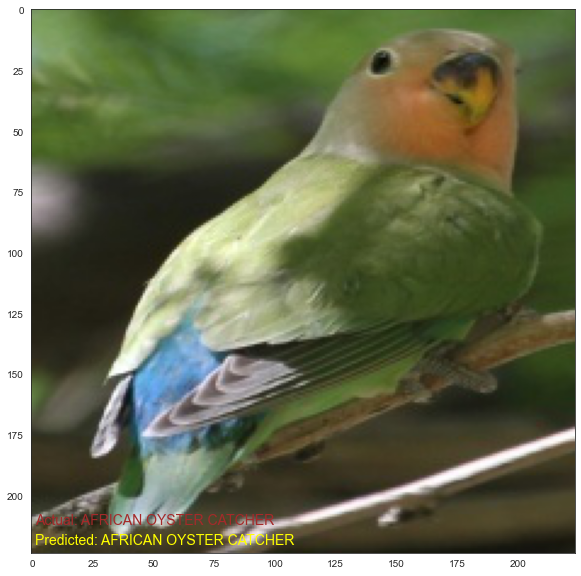

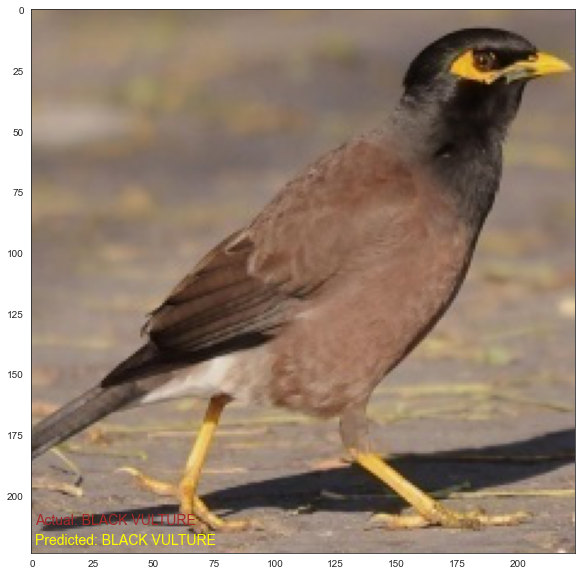

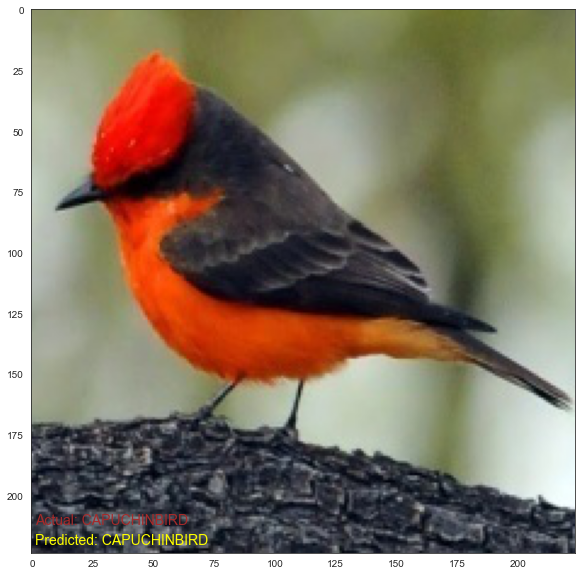

...

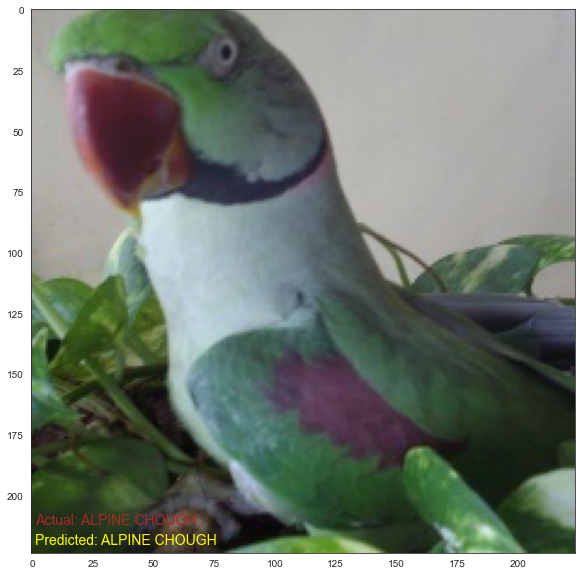

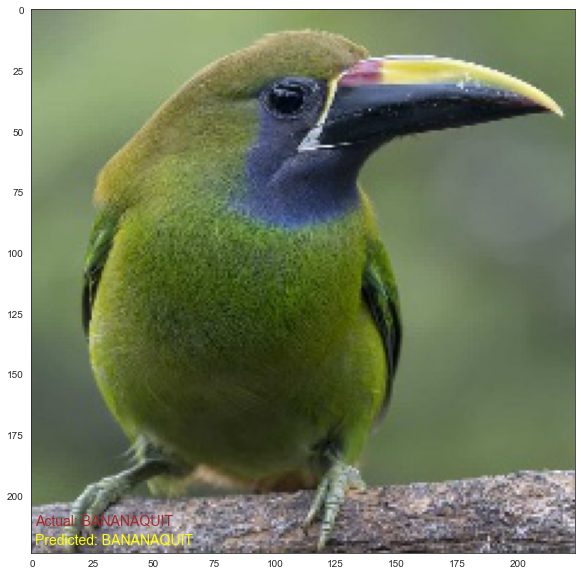

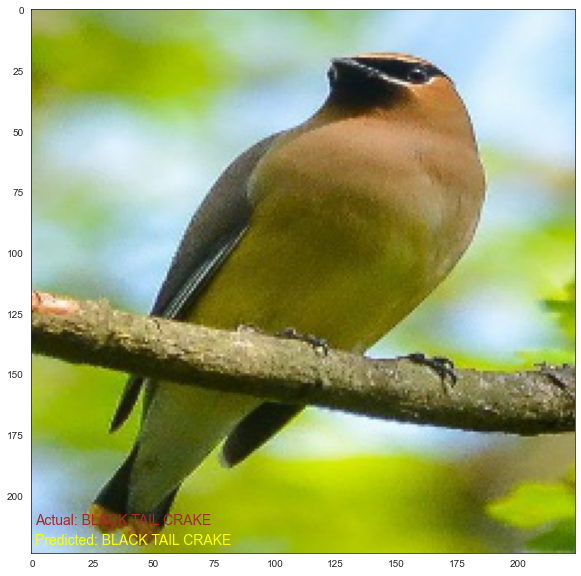

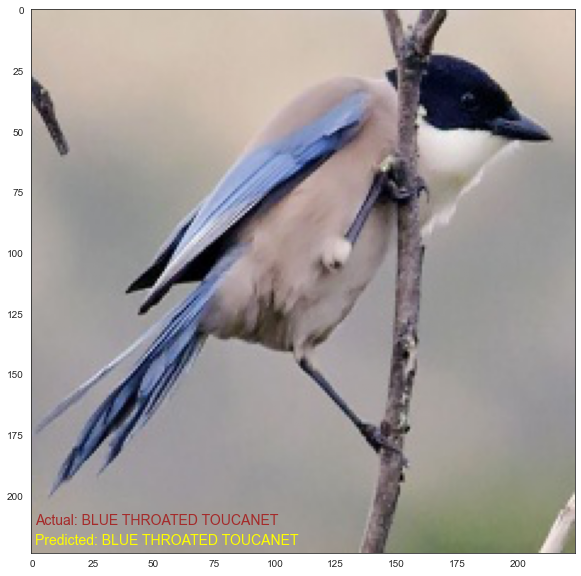

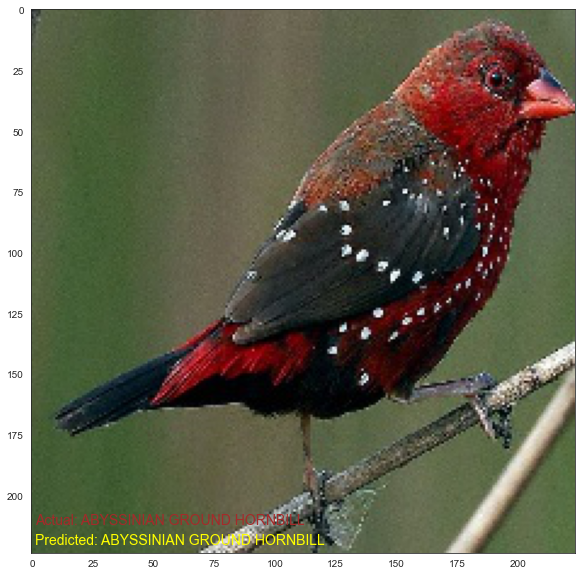

sample accuracy = 19 out of 20


In [232]:
set_style("white")

predicted_array = model_ff.predict(X_val_features_)
def imageArray_predict(model_ff, i, y):
    predicted_bird = predicted_array[i].argmax()
    actual_bird = y
   
    plt.figure(figsize=(10,10))
    plt.imshow(x, cmap='gray')



    plt.text(1,220, 'Predicted: ' + str(birds_names.loc[birds_names['class_index'] == predicted_bird, 'class'].values[0]),
         color='yellow', fontsize=14 )

    plt.text(1,212, 'Actual: ' + str(birds_names.loc[birds_names['class_index'] == actual_bird, 'class'].values[0]),
         color='brown', fontsize=14 )
    plt.show()
    plt.close()
    

def pred_acc(model, i, y):
        predicted_bird = predicted_array[i].argmax()
        actual_bird = y
        return (predicted_bird == actual_bird)*1

# check for the first n images in the validation set 
# note: zip is a useful function for iterating in parallel 
n1 = 0 #np.random.binomial(X_val.shape[0], 0.5, 1)[0]
n2= 20#n1 + np.random.binomial(10, 0.5, 1)[0]
i=0
accuracy=0
for x, y in zip(X_val[n1:n2], y_val[n1:n2]):
    imageArray_predict(model_ff, i, y)  # <<<<<<<<<<<<< show images 
    accuracy += pred_acc(model_ff, i, y)
    i += 1
print("sample accuracy =", accuracy, 'out of', (n2-n1))

In [231]:
X_val.shape

(2355, 224, 224, 3)